# Importing necessary modules and packages

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
import glob
from moviepy.editor import VideoFileClip

%matplotlib inline

# Visualizing Image Collection

In [2]:
def list_images(images, cols = 2, rows = 6, cmap=None):
    """
    Display a list of images in a single figure with matplotlib.
    """
    plt.figure(figsize=(30,30))
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i+1)
        #Use gray scale color map if there is only one channel
        cmap = 'gray' if len(image.shape) == 2 else cmap
        plt.imshow(image, cmap = cmap)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout(pad=0, h_pad=10, w_pad=0)
    plt.show()

# Displaying some of the test images

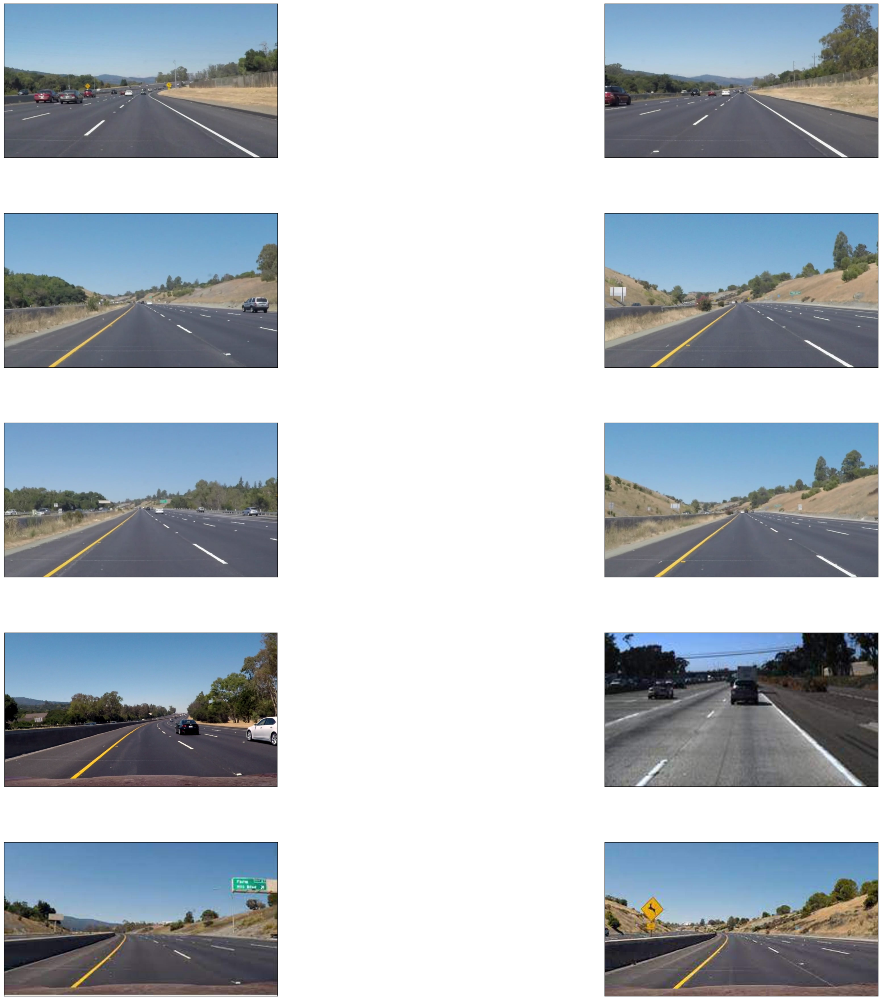

In [3]:
#Reading in the test images
test_images = [plt.imread(img) for img in glob.glob('C:/Users/Dell/Desktop/Project/Lane-lines-detection-using-Python-and-OpenCV/test_images/*.jpg')]
list_images(test_images)

# RGB Lane Line Color Selection

In [4]:
def RGB_color_selection(image):
    """
    Apply color selection to RGB images to blackout everything except for white and yellow lane lines.
    """
    #White color mask
    lower_threshold = np.uint8([200, 200, 200])
    upper_threshold = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(image, lower_threshold, upper_threshold)
    
    #Yellow color mask
    lower_threshold = np.uint8([175, 175,   0])
    upper_threshold = np.uint8([255, 255, 255])
    yellow_mask = cv2.inRange(image, lower_threshold, upper_threshold)
    
    #Combine white and yellow masks
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    masked_image = cv2.bitwise_and(image, image, mask = mask)
    
    return masked_image

# Lane Line Color Selection Results

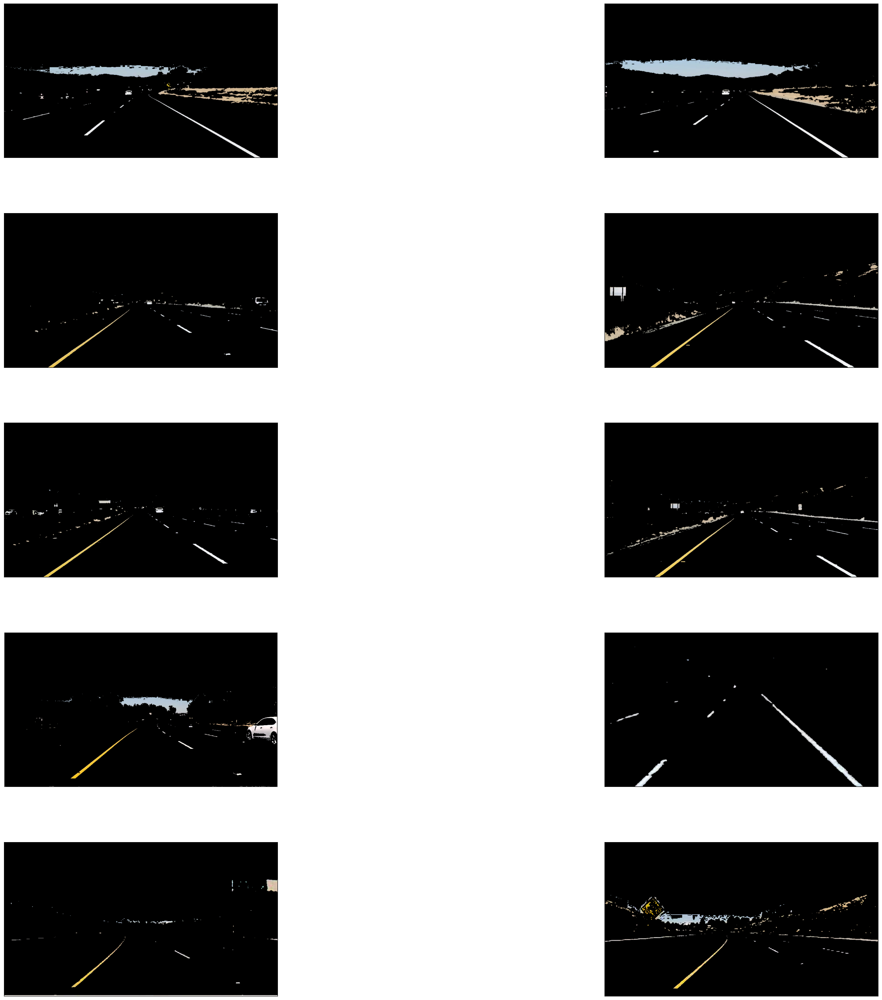

In [5]:
list_images(list(map(RGB_color_selection, test_images)))

In [6]:
color_selected_images = list(map(RGB_color_selection, test_images))

# Image Transformation: Converting to Grayscale

In [7]:
def gray_scale(image):
    """
    Convert images to gray scale.
    """
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Visual Evolution: Color to Grayscale Image Conversion

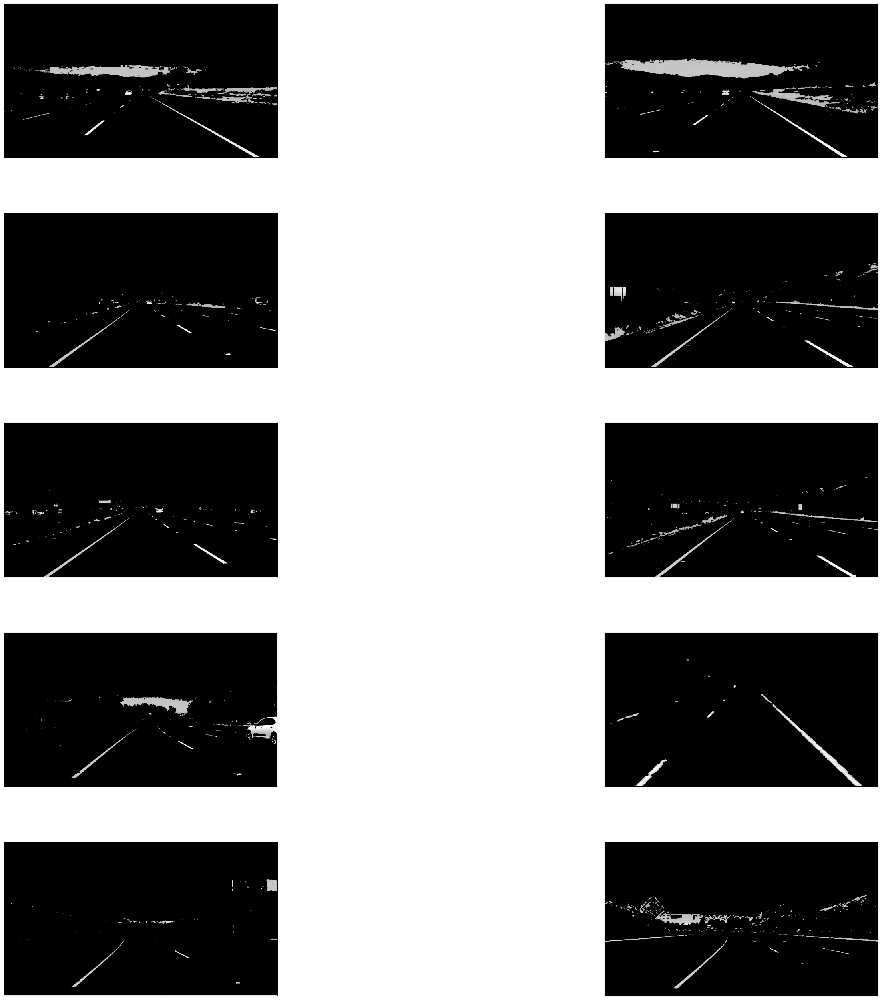

In [8]:
gray_images = list(map(gray_scale, color_selected_images))
list_images(gray_images)

# Image Refinement: Gaussian Smoothing for Enhanced Clarity 

In [9]:
def gaussian_smoothing(image, kernel_size = 13):
    """
    Apply Gaussian filter to the input image.
    """
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

# Refined Visuals: Gaussian Blur Enhancements on Grayscale Images

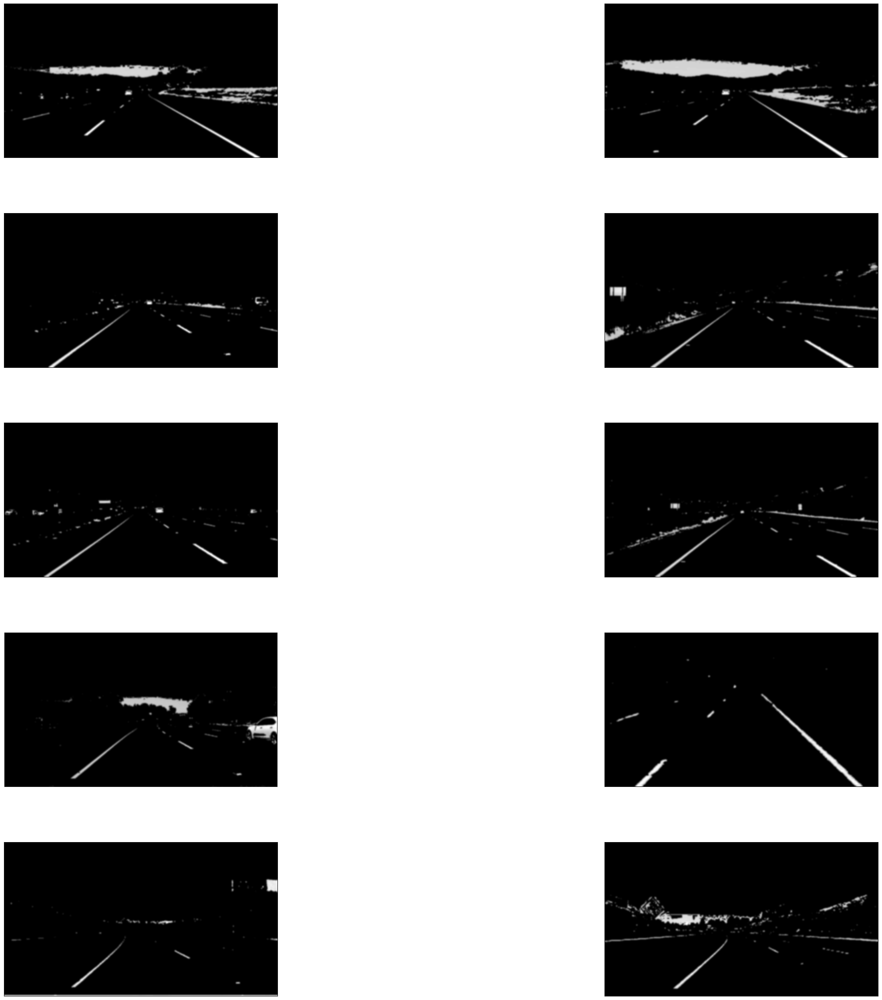

In [10]:
blur_images = list(map(gaussian_smoothing, gray_images))
list_images(blur_images)

# Edge Perception: Unveiling Details with Canny Edge Detection

In [11]:
def canny_detector(image, low_threshold = 50, high_threshold = 150):
    """
    Apply Canny Edge Detection algorithm to the input image.
    """
    return cv2.Canny(image, low_threshold, high_threshold)

# Revealing Image Structures: Canny Edge Detection on Blurred Images

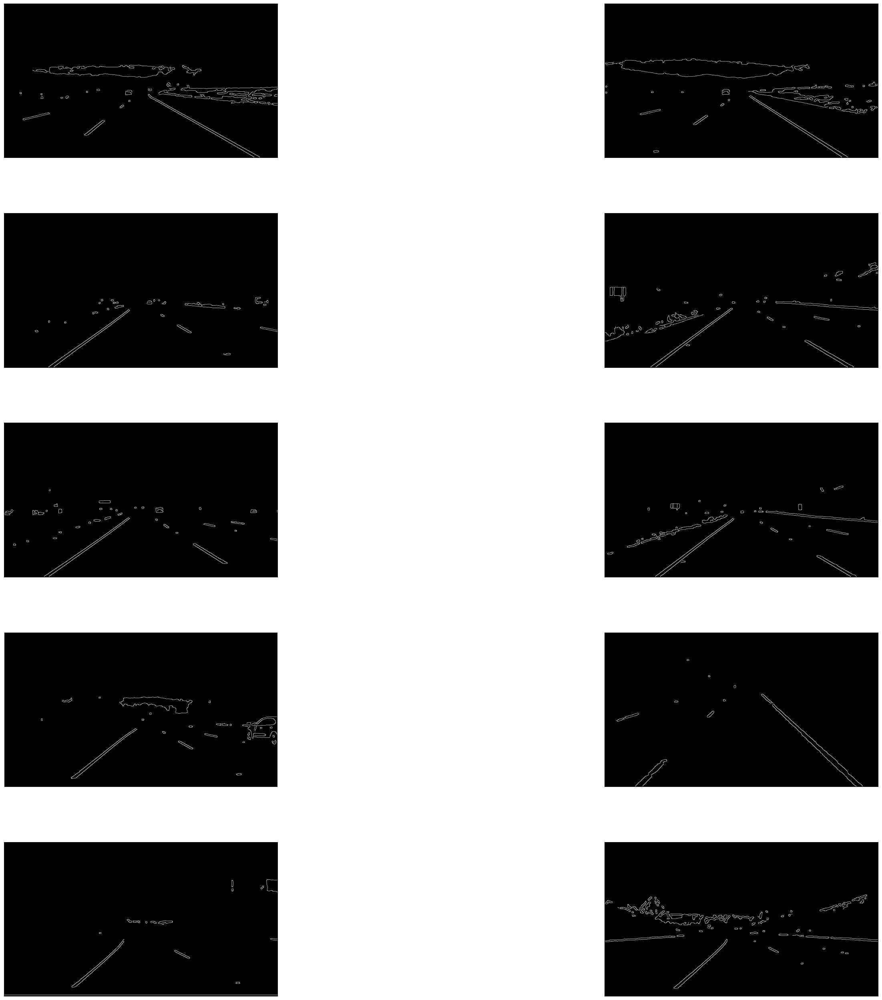

In [12]:
edge_detected_images = list(map(canny_detector, blur_images))
list_images(edge_detected_images)

# Region of Interest Extraction: Custom Masking for Image Focus

In [13]:
def region_selection(image):
    mask = np.zeros_like(image)   
    #Defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(image.shape) > 2:
        channel_count = image.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    #We could have used fixed numbers as the vertices of the polygon,
    #but they will not be applicable to images with different dimesnions.
    rows, cols = image.shape[:2]
    bottom_left  = [cols * 0.1, rows * 0.95]
    top_left     = [cols * 0.4, rows * 0.6]
    bottom_right = [cols * 0.9, rows * 0.95]
    top_right    = [cols * 0.6, rows * 0.6]
    vertices = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image = cv2.bitwise_and(image, mask)
    return masked_image

# Focused Extraction: Masking Regions of Interest in Edge-Detected Images

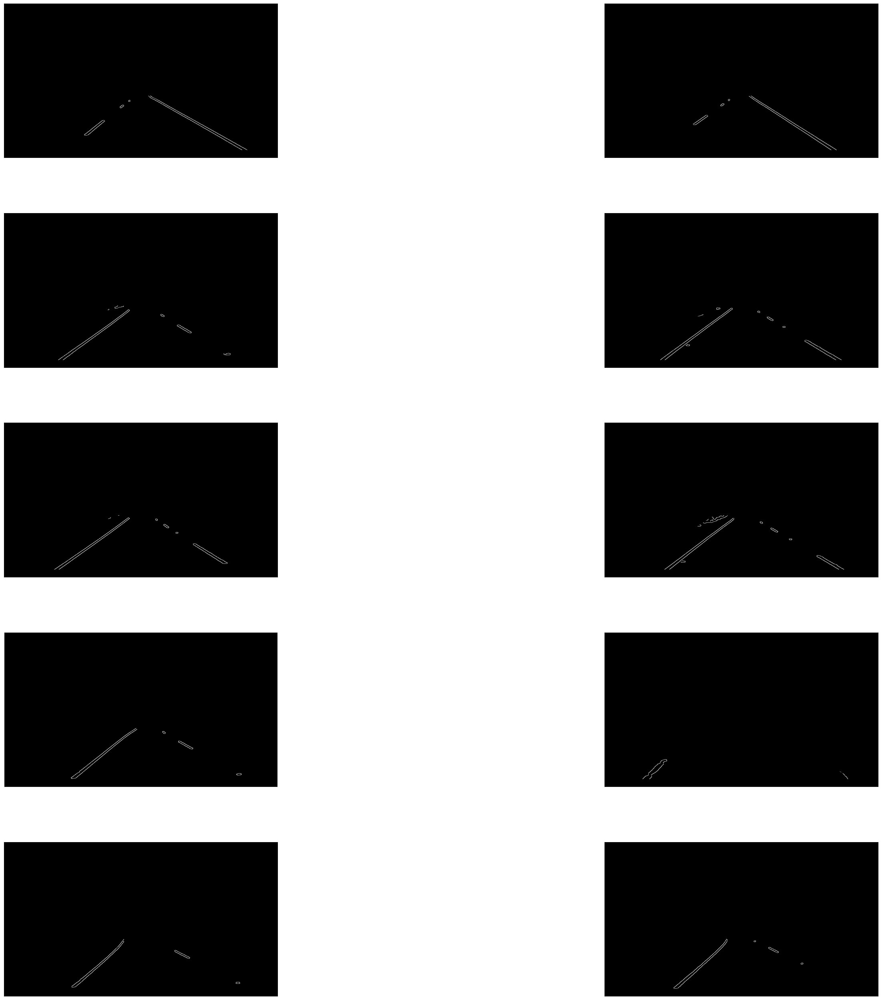

In [14]:
masked_image = list(map(region_selection, edge_detected_images))
list_images(masked_image)

# Line Detection: Hough Transform Unveiling Image Structures

In [15]:
 def hough_transform(image):
    rho = 1              
    theta = np.pi/180    
    threshold = 20       
    minLineLength = 20   
    maxLineGap = 300    
    return cv2.HoughLinesP(image, rho = rho, theta = theta, threshold = threshold,minLineLength = minLineLength, maxLineGap = maxLineGap)

# Revealing Structures: Extracted Lines using Hough Transform on Masked Images

In [16]:
hough_lines = list(map(hough_transform, masked_image))

# Visual Enhancement: Drawing Detected Lines on Images

In [17]:
def draw_lines(image, lines, color = [255,0,0], thickness=2):
    image = np.copy(image)
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(image,(x1,y1),(x2, y2),color,thickness)
    return image

# Visualized Structures: Highlighting Detected Lines on Images

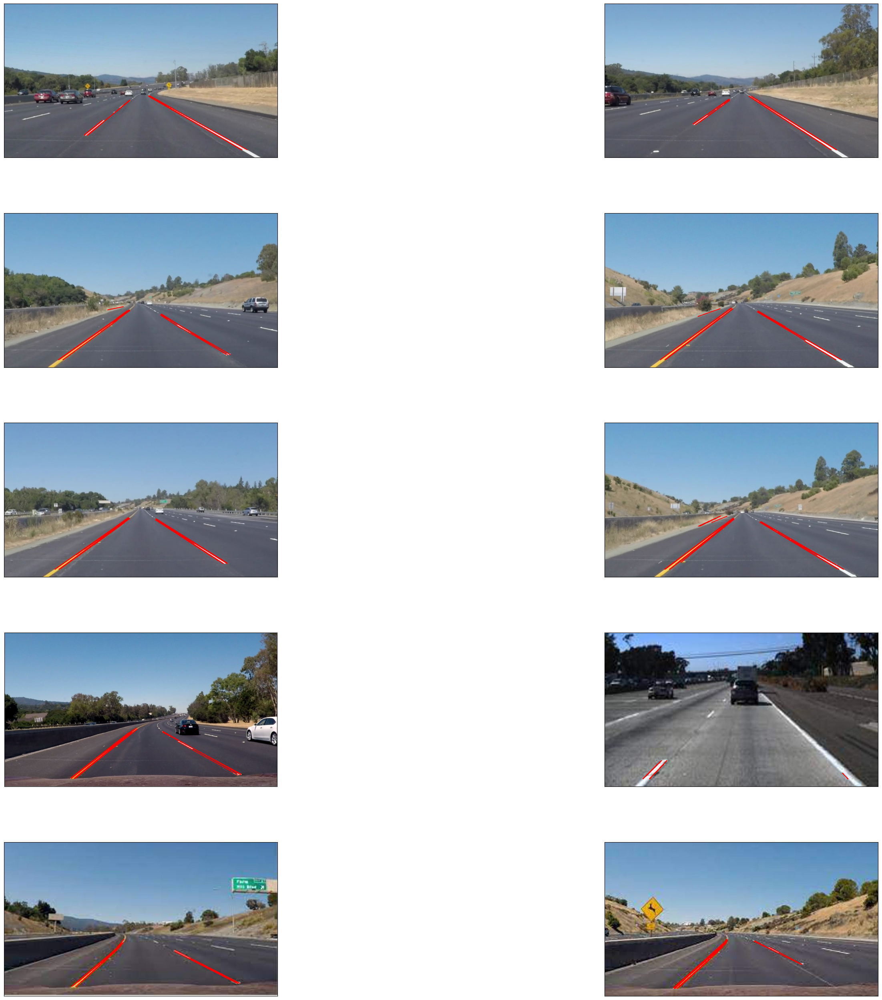

In [18]:
line_images = []
for image,lines in zip(test_images,hough_lines):
    line_images.append(draw_lines(image,lines))
    
list_images(line_images)

# Lane Line Calculation: Deriving Average Slope and Intercept for Road Markings

In [19]:
def average_slope_intercept(lines):
    left_lines    = [] 
    left_weights  = [] 
    right_lines   = [] 
    right_weights = [] 
    
    for line in lines:
        for x1, y1, x2, y2 in line:
            if x1 == x2:
                continue
            slope = (y2 - y1) / (x2 - x1)
            intercept = y1 - (slope * x1)
            length = np.sqrt(((y2 - y1) ** 2) + ((x2 - x1) ** 2))
            if slope < 0:
                left_lines.append((slope, intercept))
                left_weights.append((length))
            else:
                right_lines.append((slope, intercept))
                right_weights.append((length))
    left_lane  = np.dot(left_weights,  left_lines) / np.sum(left_weights)  if len(left_weights) > 0 else None
    right_lane = np.dot(right_weights, right_lines) / np.sum(right_weights) if len(right_weights) > 0 else None
    return left_lane, right_lane

# Coordinate Calculation: Deriving Pixel Points from Slope and Intercept for Line Visualization

In [20]:
def pixel_points(y1, y2, line):
    if line is None:
        return None
    slope, intercept = line
    x1 = int((y1 - intercept)/slope)
    x2 = int((y2 - intercept)/slope)
    y1 = int(y1)
    y2 = int(y2)
    return ((x1, y1), (x2, y2))

# Lane Detection Overlay: Visualizing Identified Lanes on Images

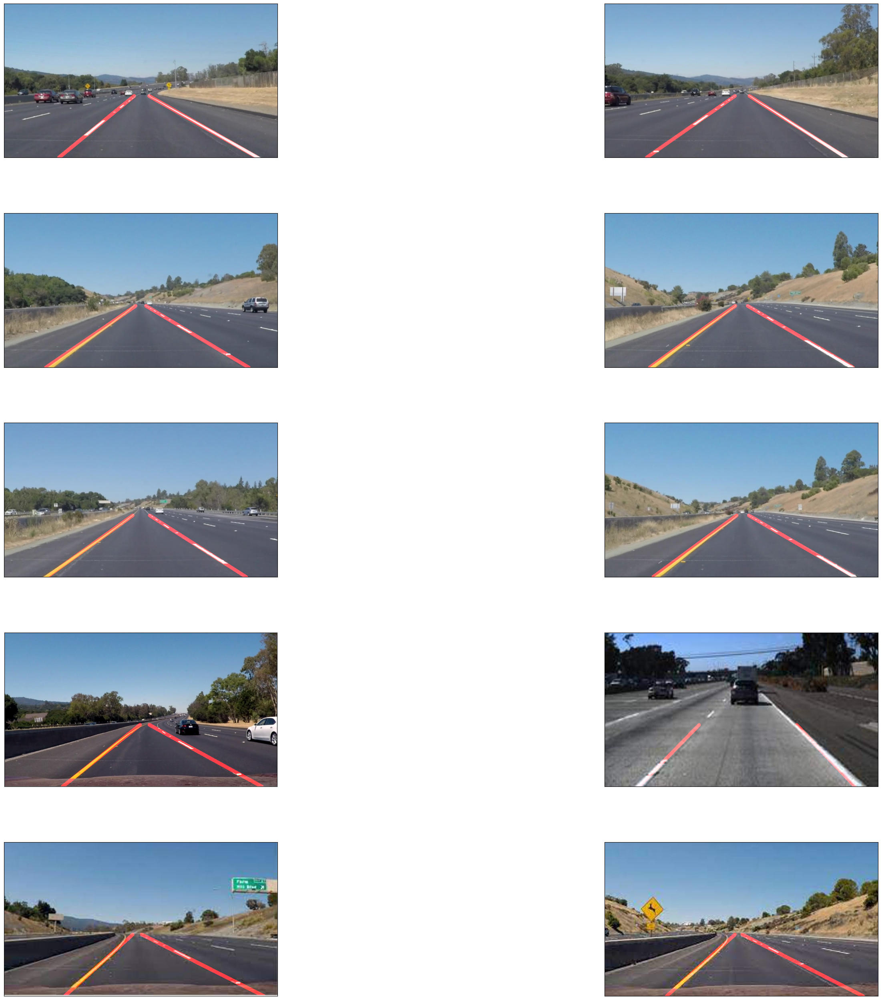

In [21]:
def lane_lines(image, lines):
    left_lane, right_lane = average_slope_intercept(lines)
    y1 = image.shape[0]
    y2 = y1 * 0.6
    left_line  = pixel_points(y1, y2, left_lane)
    right_line = pixel_points(y1, y2, right_lane)
    return left_line, right_line

    
def draw_lane_lines(image, lines, color=[255, 0, 0], thickness=12):
    line_image = np.zeros_like(image)
    for line in lines:
        if line is not None:
            cv2.line(line_image, *line,  color, thickness)
    return cv2.addWeighted(image, 1.0, line_image, 1.0, 0.0)
             
    
lane_images = []
for image, lines in zip(test_images, hough_lines):
    lane_images.append(draw_lane_lines(image, lane_lines(image, lines)))

    
list_images(lane_images)

# Lane Detection Pipeline: Processing Video for Clear Road Marking Visualization

In [22]:
from moviepy.editor import VideoFileClip
from IPython.display import display, Video , HTML

def frame_processor(image):
    
    color_select = RGB_color_selection(image)
    gray         = gray_scale(color_select)
    smooth       = gaussian_smoothing(gray)
    edges        = canny_detector(smooth)
    region       = region_selection(edges)
    hough        = hough_transform(region)
    result       = draw_lane_lines(image, lane_lines(image, hough))
    
    processed_image = image 
    
    
    return processed_image
    return result

white_output = './solidWhiteRight.mp4'
clip1 = VideoFileClip("C:/Users/Dell/Desktop/Project/Lane-lines-detection-using-Python-and-OpenCV/output_videos/solidWhiteRight_output.mp4")
white_clip = clip1.fl_image(frame_processor) 
%time white_clip.write_videofile(white_output, audio=False)




Moviepy - Building video ./solidWhiteRight.mp4.
Moviepy - Writing video ./solidWhiteRight.mp4



Moviepy - Done !
Moviepy - video ready ./solidWhiteRight.mp4
CPU times: total: 3.7 s
Wall time: 3.92 s


In [23]:
HTML("""
<video width="960" height="500" controls autoplay>
  <source src="{0}">
</video>
""".format(white_output))

In [24]:
challenge_output = './challenge.mp4'
clip1 = VideoFileClip("C:/Users/Dell/Desktop/Project/Lane-lines-detection-using-Python-and-OpenCV/output_videos/challenge_output.mp4")
white_clip = clip1.fl_image(frame_processor) 
%time white_clip.write_videofile(challenge_output, audio=False)


Moviepy - Building video ./challenge.mp4.
Moviepy - Writing video ./challenge.mp4



Moviepy - Done !
Moviepy - video ready ./challenge.mp4
CPU times: total: 9.09 s
Wall time: 8.48 s


In [25]:
HTML("""
<video width="960" height="500" controls autoplay>
<source src="{0}">
</video>""".format(challenge_output))

In [26]:
solidYellowLeft_output = './solidYellowLeft.mp4'
clip1 = VideoFileClip("C:/Users/Dell/Desktop/Project/Lane-lines-detection-using-Python-and-OpenCV/output_videos/solidYellowLeft_output.mp4")
white_clip = clip1.fl_image(frame_processor) 
%time white_clip.write_videofile(solidYellowLeft_output, audio=False)


Moviepy - Building video ./solidYellowLeft.mp4.
Moviepy - Writing video ./solidYellowLeft.mp4



Moviepy - Done !
Moviepy - video ready ./solidYellowLeft.mp4
CPU times: total: 19.2 s
Wall time: 13.4 s


In [27]:
HTML("""
<video width="960" height="500" controls autoplay>
  <source src="{0}">
</video>
""".format(solidYellowLeft_output))

#  Lane detection application with a GUI

In [ ]:
import cv2
import numpy as np
import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk

def detect_lane_lines(image):

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)
    
    edges = cv2.Canny(blurred_image, 50, 150)
    
    height, width = edges.shape
    roi_vertices = [(0, height), (width / 2, height / 2), (width, height)]
    mask = np.zeros_like(edges)
    cv2.fillPoly(mask, [np.array(roi_vertices, np.int32)], 255)
    masked_edges = cv2.bitwise_and(edges, mask)
    
    lines = cv2.HoughLinesP(masked_edges, 1, np.pi / 180, 50, minLineLength=50, maxLineGap=30)
    
    left_lane_lines, right_lane_lines = [], []
    
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            slope = (y2 - y1) / (x2 - x1)
            
            
            if slope < 0:
                left_lane_lines.append(line[0])
            elif slope > 0:
                right_lane_lines.append(line[0])
    

    left_lane = average_and_extrapolate(left_lane_lines, height)

    
    right_lane = average_and_extrapolate(right_lane_lines, height)

    line_image = np.zeros_like(image)
    draw_lane_line(line_image, left_lane)
    draw_lane_line(line_image, right_lane)
    
    
    result_image = cv2.addWeighted(image, 0.8, line_image, 1, 0)
    
    return result_image

def average_and_extrapolate(lines, image_height):
    if len(lines) == 0:
        return None
    
    lines = np.array(lines)
    avg_line = np.mean(lines, axis=0, dtype=np.int32)
    
    x1, y1, x2, y2 = avg_line
    slope = (y2 - y1) / (x2 - x1)
    
    y1 = image_height
    x1 = int(x2 - (y2 - y1) / slope)
    
    y2 = int(image_height / 2) + 60
    x2 = int(x1 + (y2 - y1) / slope)
    
    return [[x1, y1, x2, y2]]

def draw_lane_line(image, line):
    if line is not None:
        x1, y1, x2, y2 = line[0]
        cv2.line(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

class LaneDetectionApp:
    def __init__(self, root):
        self.root = root
        self.root.title("Lane Detection App")

        self.canvas = tk.Canvas(root)
        self.canvas.pack()

        self.load_button = tk.Button(root, text="Load Image/Video", command=self.load_image_or_video)
        self.load_button.pack()

        self.detect_button = tk.Button(root, text="Detect Lane Lines", command=self.detect_lane_lines)
        self.detect_button.pack()

        self.image_path = None
        self.result_image = None
        self.video_source = None
        self.cap = None

    def load_image_or_video(self):
        file_path = filedialog.askopenfilename(filetypes=[("Image/Video files", "*.jpg;*.png;*.jpeg;*.mp4")])
        
        if file_path:
            if file_path.lower().endswith(('.mp4', '.avi')):
                self.video_source = file_path
                self.cap = cv2.VideoCapture(self.video_source)
            else:
                self.image_path = file_path
                image = Image.open(self.image_path)
                image = ImageTk.PhotoImage(image)
                self.canvas.config(width=image.width(), height=image.height())
                self.canvas.create_image(0, 0, anchor=tk.NW, image=image, tags="image")
                self.canvas.image = image

    def detect_lane_lines(self):
        if self.video_source:
            self.process_video()
        elif self.image_path:
            self.result_image = detect_lane_lines(cv2.imread(self.image_path))
            result_image = cv2.cvtColor(self.result_image, cv2.COLOR_BGR2RGB)
            result_image = Image.fromarray(result_image)
            result_image = ImageTk.PhotoImage(result_image)
            self.canvas.create_image(0, 0, anchor=tk.NW, image=result_image, tags="result")
            self.canvas.image = result_image

    def process_video(self):
        while True:
            ret, frame = self.cap.read()
            if not ret:
                break

            result_frame = detect_lane_lines(frame)
            result_frame = cv2.cvtColor(result_frame, cv2.COLOR_BGR2RGB)
            result_frame = Image.fromarray(result_frame)
            result_frame = ImageTk.PhotoImage(result_frame)

            self.canvas.create_image(0, 0, anchor=tk.NW, image=result_frame, tags="result")
            self.canvas.image = result_frame

            self.root.update()
            self.root.after(10)  

if __name__ == "__main__":
    root = tk.Tk()
    app = LaneDetectionApp(root)
    root.mainloop()
